In [1]:
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import (
    GridSearchCV,
    StratifiedKFold
)

from sklearn.pipeline import Pipeline

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

import sys
from pathlib import Path as _Path
sys.path.insert(0, str(_Path("..").resolve()))

from pipeline import labels as pipeline_labels
from pipeline import paths as pipeline_paths

In [2]:
#Read label files

# pipeline.labels.load_label_map() honors a real
# ../data/chinese_traffic_signs/labels.csv if present, else falls back to
# the numeric category id as the display label (this Kaggle dataset does
# not ship a labels.csv).
label_map = pipeline_labels.load_label_map()

print("Number of class names:", len(label_map))
print(label_map)

Number of class names: 58
{0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8', 9: '9', 10: '10', 11: '11', 12: '12', 13: '13', 14: '14', 15: '15', 16: '16', 17: '17', 18: '18', 19: '19', 20: '20', 21: '21', 22: '22', 23: '23', 24: '24', 25: '25', 26: '26', 27: '27', 28: '28', 29: '29', 30: '30', 31: '31', 32: '32', 33: '33', 34: '34', 35: '35', 36: '36', 37: '37', 38: '38', 39: '39', 40: '40', 41: '41', 42: '42', 43: '43', 44: '44', 45: '45', 46: '46', 47: '47', 48: '48', 49: '49', 50: '50', 51: '51', 52: '52', 53: '53', 54: '54', 55: '55', 56: '56', 57: '57'}


In [3]:
FEATURE_DIR = pipeline_paths.FEATURE_DIR

TRAIN_FILE = (
    FEATURE_DIR
    / "chinese_traffic_signs_hog_features_train.npz"
)

TEST_FILE = (
    FEATURE_DIR
    / "chinese_traffic_signs_hog_features_test.npz"
)


train_data = np.load(TRAIN_FILE)
test_data = np.load(TEST_FILE)

X_train_full = train_data["X"]
y_train_full = train_data["y"]
train_filenames = train_data["filenames"]

X_test = test_data["X"]
y_test = test_data["y"]
test_filenames = test_data["filenames"]

print("Training features:", X_train_full.shape)
print("Training labels:", y_train_full.shape)
print("Training filenames:", train_filenames.shape)

print("Testing features:", X_test.shape)
print("Testing labels:", y_test.shape)
print("Testing filenames:", test_filenames.shape)

Training features: (4719, 1764)
Training labels: (4719,)
Training filenames: (4719,)
Testing features: (1177, 1764)
Testing labels: (1177,)
Testing filenames: (1177,)


In [4]:
print("Number of training samples:", len(X_train_full))
print("Number of testing samples:", len(X_test))

print(
    "Number of classes:",
    len(np.unique(y_train_full))
)

print(
    "Classes:",
    np.unique(y_train_full)
)

print(
    "HOG features per image:",
    X_train_full.shape[1]
)

Number of training samples: 4719
Number of testing samples: 1177
Number of classes: 58
Classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57]
HOG features per image: 1764


In [5]:
print(
    "NaN in training:",
    np.isnan(X_train_full).any()
)

print(
    "NaN in testing:",
    np.isnan(X_test).any()
)

print(
    "Infinity in training:",
    np.isinf(X_train_full).any()
)

print(
    "Infinity in testing:",
    np.isinf(X_test).any()
)

NaN in training: False
NaN in testing: False
Infinity in training: False
Infinity in testing: False


In [6]:
cv = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

print("Training samples:", X_train_full.shape)
print("Final test samples:", X_test.shape)
print("Cross-validation: 2-fold StratifiedKFold")

Training samples: (4719, 1764)
Final test samples: (1177, 1764)
Cross-validation: 2-fold StratifiedKFold


In [7]:
knn_pipeline = Pipeline([
    (
        "scaler",
        StandardScaler()
    ),
    (
        "knn",
        KNeighborsClassifier()
    )
])

print("KNN pipeline created.")

KNN pipeline created.


In [8]:
param_grid = {
    "knn__n_neighbors": list(range(1, 16)),
    "knn__weights": [
        "uniform",
        "distance"
    ],
    "knn__metric": [
        "euclidean",
        "manhattan"
    ]
}

grid_search = GridSearchCV(
    estimator=knn_pipeline,
    param_grid=param_grid,
    scoring="f1_macro",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    return_train_score=True,
    refit=True
)

grid_search.fit(
    X_train_full,
    y_train_full
)

print("Grid search completed.")

Fitting 2 folds for each of 60 candidates, totalling 120 fits


Grid search completed.


In [9]:
results_df = pd.DataFrame(
    grid_search.cv_results_
)

results_df = results_df[[
    "param_knn__n_neighbors",
    "param_knn__weights",
    "param_knn__metric",
    "mean_test_score",
    "std_test_score",
    "mean_train_score",
    "rank_test_score"
]]

results_df = results_df.rename(
    columns={
        "param_knn__n_neighbors": "K",
        "param_knn__weights": "Weights",
        "param_knn__metric": "Metric",
        "mean_test_score": "Mean CV Macro F1",
        "std_test_score": "CV F1 Std",
        "mean_train_score": "Mean Train Macro F1",
        "rank_test_score": "Rank"
    }
)

results_df = results_df.sort_values(
    by="Rank"
).reset_index(drop=True)

display(
    results_df.head(20)
)

,K,Weights,Metric,Mean CV Macro F1,CV F1 Std,Mean Train Macro F1,Rank
0,1,uniform,euclidean,0.934123,0.005176,1.0,1
1,1,distance,euclidean,0.934123,0.005176,1.0,1
2,2,distance,euclidean,0.934123,0.005176,1.0,1
3,1,distance,manhattan,0.933570,0.002060,1.0,4
4,1,uniform,manhattan,0.933570,0.002060,1.0,4
5,2,distance,manhattan,0.933570,0.002060,1.0,4
6,3,distance,manhattan,0.928134,0.000861,1.0,7
7,3,distance,euclidean,0.925400,0.005196,1.0,8
8,4,distance,manhattan,0.914574,0.010790,1.0,9
9,5,distance,manhattan,0.912280,0.011107,1.0,10


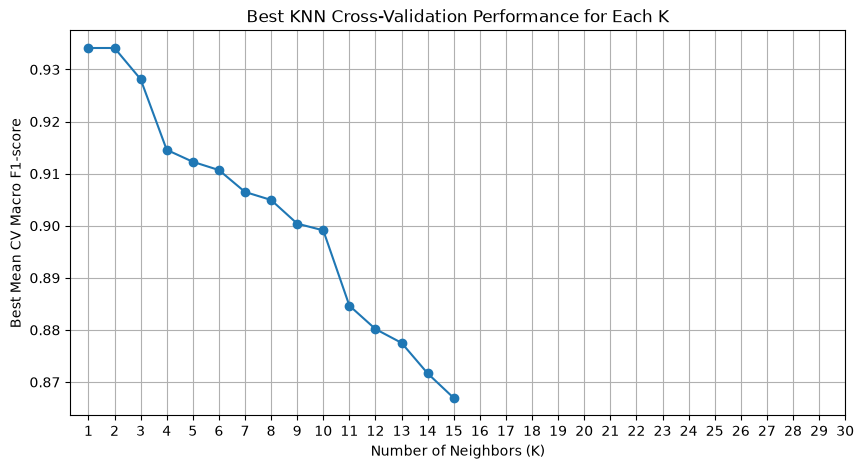

In [10]:
best_score_per_k = (
    results_df
    .groupby("K")["Mean CV Macro F1"]
    .max()
    .reset_index()
)

plt.figure(
    figsize=(10, 5)
)

plt.plot(
    best_score_per_k["K"],
    best_score_per_k["Mean CV Macro F1"],
    marker="o"
)

plt.xlabel(
    "Number of Neighbors (K)"
)

plt.ylabel(
    "Best Mean CV Macro F1-score"
)

plt.title(
    "Best KNN Cross-Validation Performance for Each K"
)

plt.xticks(
    range(1, 31)
)

plt.grid()

plt.show()

In [11]:
best_parameters = (
    grid_search.best_params_
)

best_k = int(
    best_parameters[
        "knn__n_neighbors"
    ]
)

best_weights = (
    best_parameters[
        "knn__weights"
    ]
)

best_metric = (
    best_parameters[
        "knn__metric"
    ]
)

best_cv_f1 = (
    grid_search.best_score_
)

print("Best KNN Configuration")
print("----------------------")

print(
    "Best K:",
    best_k
)

print(
    "Best Weights:",
    best_weights
)

print(
    "Best Metric:",
    best_metric
)

print(
    f"Best Mean CV Macro F1: "
    f"{best_cv_f1:.4f}"
)

Best KNN Configuration
----------------------
Best K: 1
Best Weights: uniform
Best Metric: euclidean
Best Mean CV Macro F1: 0.9341


In [12]:
#Train on the best k value model

In [13]:
final_scaler = StandardScaler()

X_train_full_scaled = (
    final_scaler.fit_transform(
        X_train_full
    )
)

X_test_final_scaled = (
    final_scaler.transform(
        X_test
    )
)

In [14]:
final_knn = KNeighborsClassifier(
    n_neighbors=best_k,
    weights=best_weights,
    metric=best_metric
)

final_knn.fit(
    X_train_full_scaled,
    y_train_full
)

y_train_pred = final_knn.predict(
    X_train_full_scaled
)

print(
    "Final KNN Model"
)

print(
    "---------------"
)

print(
    f"K       : {best_k}"
)

print(
    f"Weights : {best_weights}"
)

print(
    f"Metric  : {best_metric}"
)

Final KNN Model
---------------
K       : 1
Weights : uniform
Metric  : euclidean


In [15]:
from PIL import Image

DATASET_DIR = Path(
    "../data/chinese_traffic_signs"
)

# Find all image files
IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".ppm"
}

all_images = [
    p for p in DATASET_DIR.rglob("*")
    if p.is_file()
    and p.suffix.lower() in IMAGE_EXTENSIONS
]

# filename -> full path
image_lookup = {
    p.name: p
    for p in all_images
}

print("Images found:", len(image_lookup))

Images found: 5998


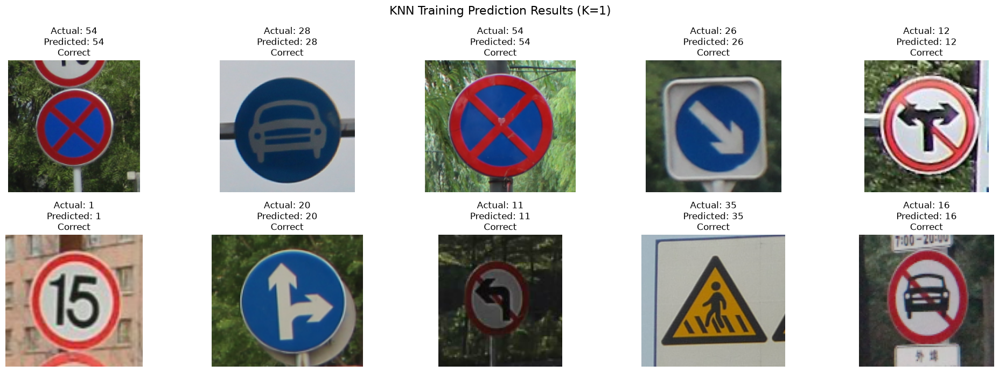

In [16]:
sample_count = min(
    10,
    len(y_train_full)
)

sample_indices = np.linspace(
    0,
    len(y_train_full) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()

for ax, index in zip(
    axes,
    sample_indices
):

    filename = str(
        train_filenames[index]
    )

    actual = int(
        y_train_full[index]
    )

    predicted = int(
        y_train_pred[index]
    )

    image_path = image_lookup.get(
        filename
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(image)

    correct = actual == predicted

    ax.set_title(
        f"Actual: {label_map[actual]}\n"
        f"Predicted: {label_map[predicted]}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")

plt.suptitle(
    f"KNN Training Prediction Results (K={best_k})",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [17]:
#Test on public dataset test set

In [18]:
y_test_pred = final_knn.predict(
    X_test_final_scaled
)

In [19]:
test_accuracy = accuracy_score(
    y_test,
    y_test_pred
)

test_precision = precision_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

test_recall = recall_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

test_f1 = f1_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

print("KNN Final Test Results")
print("----------------------")

print(
    f"Accuracy  : {test_accuracy:.4f}"
)

print(
    f"Precision : {test_precision:.4f}"
)

print(
    f"Recall    : {test_recall:.4f}"
)

print(
    f"F1-score  : {test_f1:.4f}"
)

KNN Final Test Results
----------------------
Accuracy  : 0.9881
Precision : 0.9917
Recall    : 0.9856
F1-score  : 0.9874


In [20]:
print(
    classification_report(
        y_test,
        y_test_pred,
        zero_division=0
    )
)

              precision    recall  f1-score   support

           0       0.92      0.92      0.92        26
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        20
           3       1.00      1.00      1.00        63
           4       1.00      0.94      0.97        31
           5       1.00      0.96      0.98        48
           6       1.00      1.00      1.00        22
           7       1.00      1.00      1.00        40
           8       1.00      1.00      1.00         4
          10       1.00      1.00      1.00        26
          11       1.00      1.00      1.00        49
          12       1.00      1.00      1.00        23
          13       1.00      1.00      1.00        23
          14       1.00      1.00      1.00        28
          15       1.00      1.00      1.00        11
          16       1.00      0.95      0.98        42
          17       1.00      1.00      1.00        38
          18       1.00    

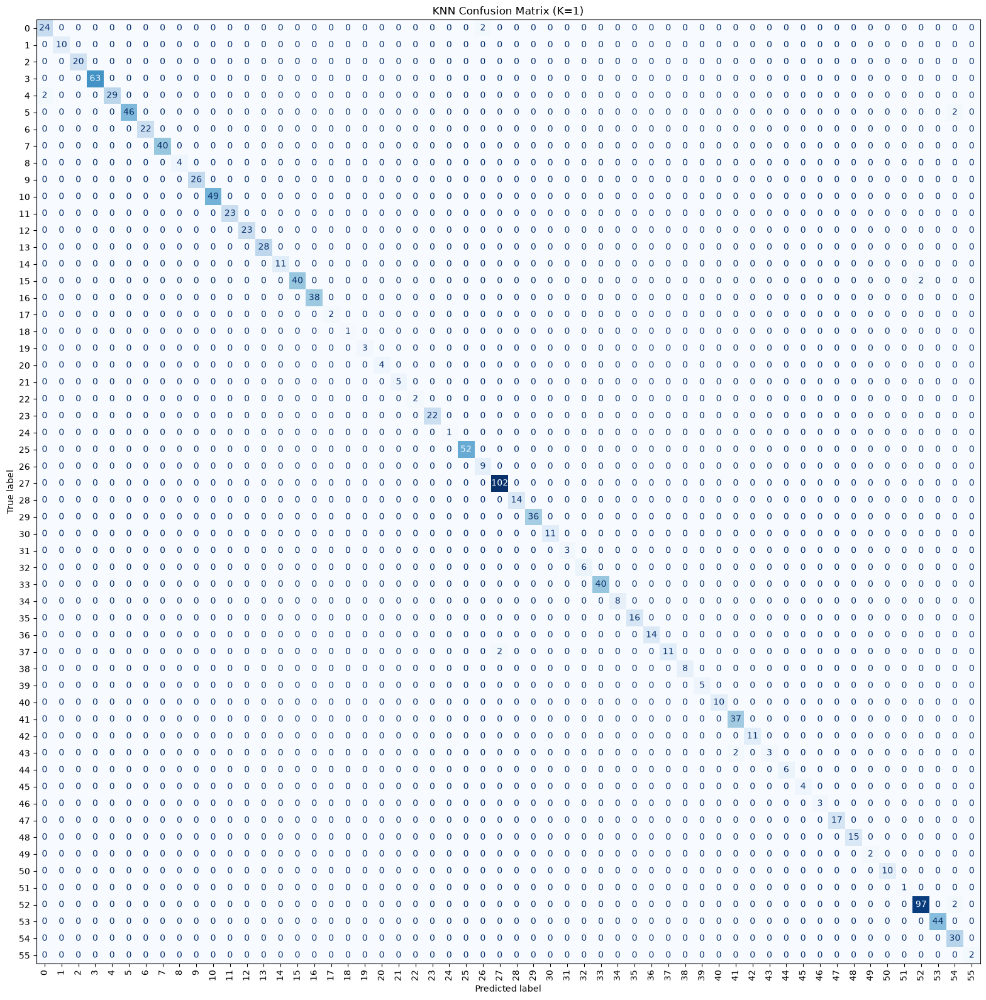

In [21]:
cm = confusion_matrix(
    y_test,
    y_test_pred
)

fig, ax = plt.subplots(
    figsize=(16, 16)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

plt.title(
    f"KNN Confusion Matrix (K={best_k})"
)

plt.tight_layout()
plt.show()

In [22]:
sample_count = min(
    10,
    len(y_test)
)

sample_indices = np.linspace(
    0,
    len(y_test) - 1,
    sample_count,
    dtype=int
)

prediction_results = []

for index in sample_indices:

    actual = int(
        y_test[index]
    )

    predicted = int(
        y_test_pred[index]
    )

    prediction_results.append({
        "Test Index": index,
        "Actual Class": actual,
        "Predicted Class": predicted,
        "Correct": actual == predicted
    })

prediction_df = pd.DataFrame(
    prediction_results
)

display(prediction_df)

,Test Index,Actual Class,Predicted Class,Correct
0,0,54,54,True
1,130,29,29,True
2,261,10,10,True
3,392,55,55,True
4,522,55,55,True
5,653,11,11,True
6,784,16,16,True
7,914,10,10,True
8,1045,16,16,True
9,1176,3,3,True


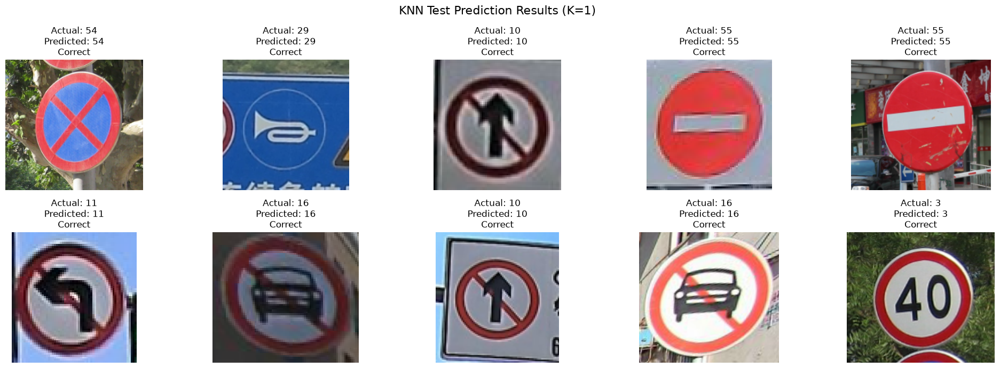

In [23]:
sample_count = min(
    10,
    len(y_test)
)

sample_indices = np.linspace(
    0,
    len(y_test) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()

for ax, index in zip(
    axes,
    sample_indices
):

    filename = str(
        test_filenames[index]
    )

    actual = int(
        y_test[index]
    )

    predicted = int(
        y_test_pred[index]
    )

    image_path = image_lookup.get(
        filename
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(image)

    correct = actual == predicted

    ax.set_title(
        f"Actual: {label_map[actual]}\n"
        f"Predicted: {label_map[predicted]}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")

plt.suptitle(
    f"KNN Test Prediction Results (K={best_k})",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [24]:
#def function to provide the segemented image with black background
#and def function to display the result

In [25]:
# pipeline.preprocessing.get_roi() is the exact same segment+mask routine
# 01-roi-segmentation and 02-feature-extraction use to build the HOG
# features loaded above - reusing it here (rather than a separate
# hand-rolled segmentation copy) means these visualizations show precisely
# what fed the classifier, not an approximation of it.
from pipeline import preprocessing as pipeline_preprocessing

In [26]:
def get_segmented_image(image_path):
    """Same pipeline.preprocessing.get_roi() the feature-extraction
    notebooks call - not a separate hand-rolled segmentation copy - so this
    visualization matches exactly what fed the classifier's HOG features.
    get_roi() already blacks out the background, so roi_rgb is used as-is."""

    image_bgr = cv2.imread(str(image_path))
    original_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    roi = pipeline_preprocessing.get_roi(original_rgb)
    segmented_rgb = original_rgb if roi is None else roi[0]

    return original_rgb, segmented_rgb

In [27]:
def display_prediction_results(
    filenames,
    y_true,
    y_pred,
    image_lookup,
    title
):

    sample_indices = np.linspace(
        0,
        len(filenames) - 1,
        10,
        dtype=int
    )

    fig, axes = plt.subplots(
        10,
        2,
        figsize=(10, 36)
    )

    for row, index in enumerate(sample_indices):

        filename = Path(
            str(filenames[index])
        ).name

        image_path = image_lookup.get(
            filename
        )

        actual = int(y_true[index])
        predicted = int(y_pred[index])

        if image_path is None:
            continue

        original, segmented = get_segmented_image(
            image_path
        )

        # Original image
        axes[row, 0].imshow(original)

        axes[row, 0].set_title(
            f"Original - {filename}"
        )

        axes[row, 0].axis("off")

        # Segmented image
        axes[row, 1].imshow(segmented)

        axes[row, 1].set_title(
            f"Actual: {label_map[actual]}\n"
            f"Predicted: {label_map[predicted]}\n"
            f"{'Correct' if actual == predicted else 'Wrong'}"
        )

        axes[row, 1].axis("off")

    plt.suptitle(
        title,
        fontsize=16,
        y=0.995
    )

    plt.subplots_adjust(
        top=0.96,
        bottom=0.02,
        hspace=0.65,
        wspace=0.25
    )

    plt.show()

In [28]:
#Test on input file test dataset
######################################

In [29]:
assignment_data = np.load(
    "../features/assignment1_test_hog_features.npz"
)

X_assignment_test = assignment_data["X"]
assignment_image_paths = assignment_data["filenames"]

In [30]:
X_assignment_test_scaled = (
    final_scaler.transform(
        X_assignment_test
    )
)

print(
    "Scaled Assignment test shape:",
    X_assignment_test_scaled.shape
)

Scaled Assignment test shape: (84, 1764)


In [31]:
import time

y_assignment_pred = []
classification_times = []

for i in range(
    len(X_assignment_test_scaled)
):

    # One image feature vector
    X_one = X_assignment_test_scaled[
        i:i + 1
    ]

    # Start timer
    start_time = time.perf_counter()

    # KNN classification
    prediction = final_knn.predict(
        X_one
    )[0]

    # End timer
    end_time = time.perf_counter()

    runtime = (
        end_time - start_time
    )

    y_assignment_pred.append(
        prediction
    )

    classification_times.append(
        runtime
    )


# Convert to NumPy array
y_assignment_pred = np.array(
    y_assignment_pred
)

classification_times = np.array(
    classification_times
)


In [32]:
print(
    "KNN Classification Runtime"
)

print(
    "--------------------------"
)

print(
    f"Average time per image : "
    f"{classification_times.mean():.6f} seconds"
)

print(
    f"Maximum time per image : "
    f"{classification_times.max():.6f} seconds"
)

print(
    f"Minimum time per image : "
    f"{classification_times.min():.6f} seconds"
)

print(
    f"All images below 2 sec : "
    f"{np.all(classification_times < 2)}"
)

KNN Classification Runtime
--------------------------
Average time per image : 0.020067 seconds
Maximum time per image : 0.027873 seconds
Minimum time per image : 0.018484 seconds
All images below 2 sec : True


In [33]:
print(
    "Number of predictions:",
    len(y_assignment_pred)
)

print(
    "First 10 predictions:",
    y_assignment_pred[:10]
)

Number of predictions: 84
First 10 predictions: [ 1  2  5 20 20 20 21 21 27 31]


In [34]:
# The true label used to be regex-parsed from the filename (its first
# three digits). It is now saved directly by
# 02-feature-extraction/01_hog_features_chinese.ipynb (pulled from
# annotations.csv, not guessed from the filename).
y_assignment_test = assignment_data["y"]

print(
    "Actual labels:",
    y_assignment_test.shape
)

print(
    "First 10 actual labels:",
    y_assignment_test[:10]
)

Actual labels: (84,)
First 10 actual labels: [ 1  2  5 20 20 20 21 21 27 31]


In [35]:
assignment_accuracy = accuracy_score(
    y_assignment_test,
    y_assignment_pred
)

assignment_precision = precision_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

assignment_recall = recall_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

assignment_f1 = f1_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

print(
    "KNN Results on 84 Assignment Test Images"
)

print(
    "-----------------------------------------"
)

print(
    f"Accuracy  : {assignment_accuracy:.4f}"
)

print(
    f"Precision : {assignment_precision:.4f}"
)

print(
    f"Recall    : {assignment_recall:.4f}"
)

print(
    f"F1-score  : {assignment_f1:.4f}"
)

KNN Results on 84 Assignment Test Images
-----------------------------------------
Accuracy  : 1.0000
Precision : 1.0000
Recall    : 1.0000
F1-score  : 1.0000


In [36]:
# =========================================================
# 6. Create full prediction results table
# =========================================================

assignment_results = []

for image_path, actual, predicted in zip(
    assignment_image_paths,
    y_assignment_test,
    y_assignment_pred
):

    actual = int(actual)
    predicted = int(predicted)

    assignment_results.append({

        "Filename":
            Path(str(image_path)).name,

        "Actual Class":
            actual,

        "Actual Sign":
            label_map.get(
                actual,
                f"Class {actual}"
            ),

        "Predicted Class":
            predicted,

        "Predicted Sign":
            label_map.get(
                predicted,
                f"Class {predicted}"
            ),

        "Correct":
            actual == predicted
    })


assignment_results_df = pd.DataFrame(
    assignment_results
)

display(
    assignment_results_df
)

,Filename,Actual Class,Actual Sign,Predicted Class,Predicted Sign,Correct
0,001_0004.png,1,1,1,1,True
1,002_0036.png,2,2,2,2,True
2,005_0030.png,5,5,5,5,True
3,020_0003.png,20,20,20,20,True
4,020_0004.png,20,20,20,20,True
...,...,...,...,...,...,...
79,029_1_0015.png,29,29,29,29,True
80,031_1_0020.png,31,31,31,31,True
81,036_1_0014.png,36,36,36,36,True
82,036_1_0016.png,36,36,36,36,True


In [37]:
import sys
from pathlib import Path as _Path
sys.path.insert(0, str(_Path("..").resolve()))
from pipeline import annotations as pipeline_annotations

assignment_images = pipeline_annotations.list_dataset_images()

assignment_image_lookup = {
    p.name: p
    for p in assignment_images
}

print(
    "Dataset images available for visualisation:",
    len(assignment_images)
)

Dataset images available for visualisation: 5998


001_0004.png
031_0011.png
051_0005_j.png
037_0019.png
002_1_0010.png
023_1_0003.png
032_1_0002_1_j.png
045_1_0004.png
030_1_0018_1_j.png
036_1_0019.png


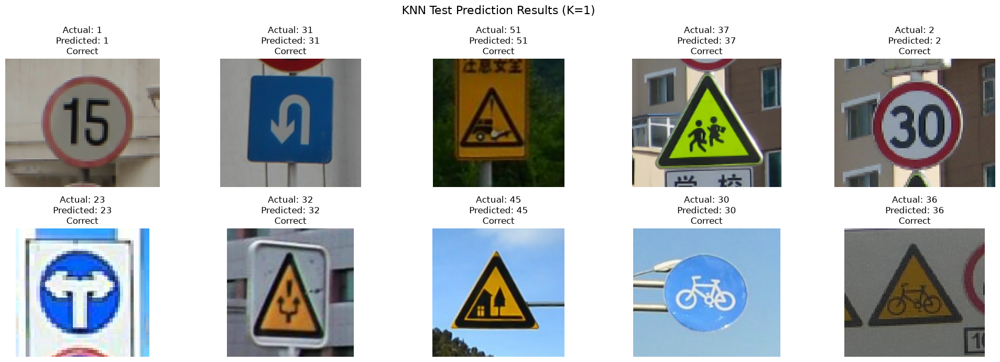

In [38]:
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

sample_count = min(
    10,
    len(assignment_image_paths)
)

sample_indices = np.linspace(
    0,
    len(assignment_image_paths) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()

for ax, index in zip(
    axes,
    sample_indices
):

    # Get only the image filename
    filename = Path(
        str(assignment_image_paths[index])
    ).name

    print(filename)

    actual = int(
        y_assignment_test[index]
    )

    predicted = int(
        y_assignment_pred[index]
    )

    # Find the actual image path
    image_path = assignment_image_lookup.get(
        filename
    )

    if image_path is not None:

        # Open the image
        image = Image.open(
            image_path
        ).convert("RGB")

        # Display image
        ax.imshow(image)


    correct = (
        actual == predicted
    )

    ax.set_title(
        f"Actual: {label_map[actual]}\n"
        f"Predicted: {label_map[predicted]}\n"
        f"{'Correct' if correct else 'Wrong'}",
    )

    ax.axis("off")

plt.suptitle(
    f"KNN Test Prediction Results (K={best_k})",
    fontsize=16
)

plt.tight_layout()
plt.show()

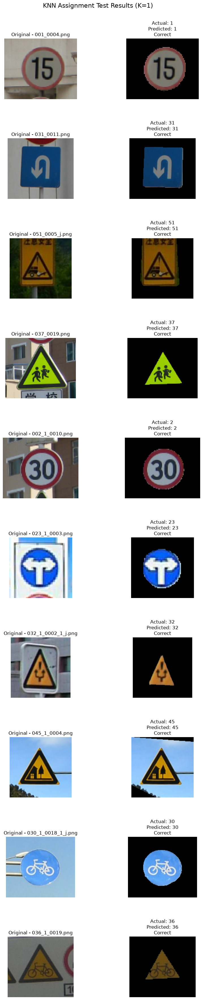

In [39]:
display_prediction_results(
    assignment_image_paths,
    y_assignment_test,
    y_assignment_pred,
    assignment_image_lookup,
    f"KNN Assignment Test Results (K={best_k})"
)

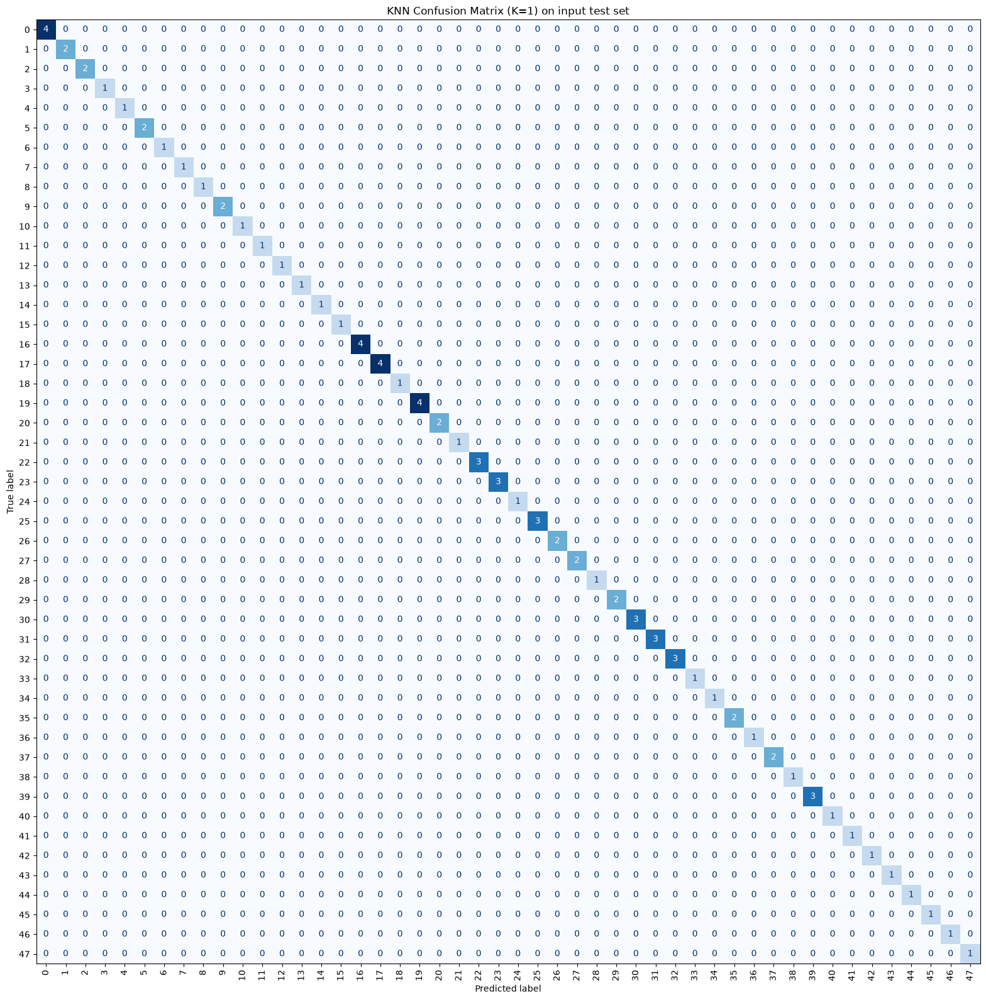

In [40]:
cm = confusion_matrix(
    y_assignment_test,
    y_assignment_pred
)

fig, ax = plt.subplots(
    figsize=(16, 16)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

plt.title(
    f"KNN Confusion Matrix (K={best_k}) on input test set"
)

plt.tight_layout()
plt.show()

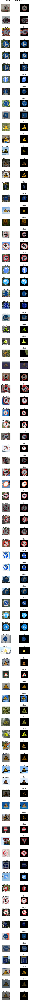

In [41]:
# Display ALL assignment test results

total_results = len(assignment_image_paths)

fig, axes = plt.subplots(
    total_results,
    2,
    figsize=(10, 2.8 * total_results),
    squeeze=False
)

for row, index in enumerate(
    range(total_results)
):

    filename = Path(
        str(assignment_image_paths[index])
    ).name

    actual = int(
        y_assignment_test[index]
    )

    predicted = int(
        y_assignment_pred[index]
    )

    correct = (
        actual == predicted
    )

    image_path = assignment_image_lookup.get(
        filename
    )

    if image_path is None:
        axes[row, 0].axis("off")
        axes[row, 1].axis("off")
        continue

    # Get original and segmented image
    original, segmented = get_segmented_image(
        image_path
    )

    # -------------------------
    # Original image
    # -------------------------
    axes[row, 0].imshow(
        original
    )

    axes[row, 0].set_title(
        f"Original - {filename}",
        fontsize=9
    )

    axes[row, 0].axis(
        "off"
    )

    # -------------------------
    # Segmented image
    # -------------------------
    axes[row, 1].imshow(
        segmented
    )

    axes[row, 1].set_title(
        f"Actual: {label_map.get(actual, actual)}\n"
        f"Predicted: {label_map.get(predicted, predicted)}\n"
        f"{'Correct' if correct else 'Wrong'}",
        fontsize=9
    )

    axes[row, 1].axis(
        "off"
    )


plt.suptitle(
    f"All KNN Assignment Test Results (K={best_k})",
    fontsize=16,
    y=0.999
)

plt.subplots_adjust(
    top=0.995,
    bottom=0.005,
    hspace=0.6,
    wspace=0.25
)

plt.show()